In [0]:
from __future__ import print_function
%matplotlib inline
import os
import warnings
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.image as image
import pandas as pd
plt.style.use("ggplot")
warnings.simplefilter("ignore")

In [0]:
plt.rcParams['figure.figsize'] = (12,8)

In [0]:
#original library is not compatible with current version of pd
!pip install git+https://github.com/pandas-profiling/pandas-profiling.git

In [0]:
import pandas_profiling

### Visualize and Explore
---

In [0]:
hr = pd.read_csv('employee_data.csv')

In [6]:
hr.profile_report(title = 'Data Report')

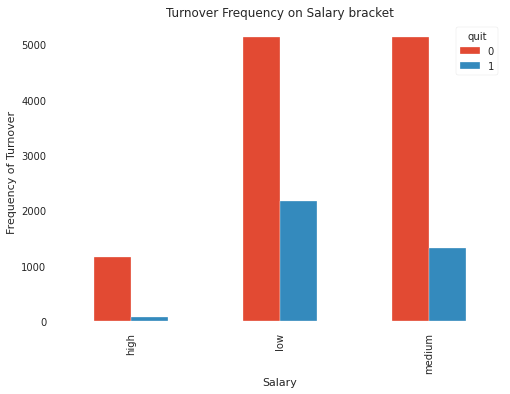

In [7]:
pd.crosstab(hr.salary, hr.quit).plot(kind = 'bar')
plt.title('Turnover Frequency on Salary bracket')
plt.xlabel('Salary')
plt.ylabel('Frequency of Turnover')
plt.show()

Kinda obvious, right? The higher salary == lower chances that the employer is going to turnover. Fascinating analysis.    

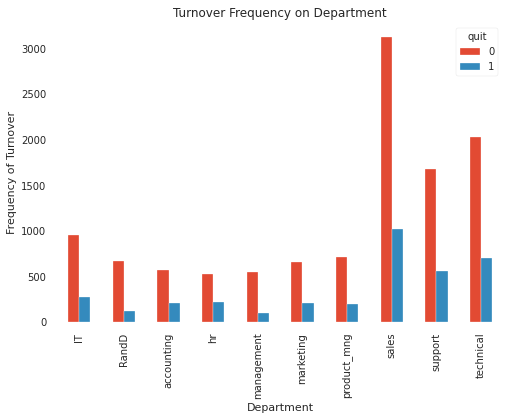

In [8]:
pd.crosstab(hr.department, hr.quit).plot(kind = 'bar')
plt.title('Turnover Frequency on Department')
plt.xlabel('Department')
plt.ylabel('Frequency of Turnover')
plt.show()

What makes me happy about this plot is that IT dep is not in top-3. And to be serious the highest turnover rate is in the Sales department, Tech, and Support. To dig a bit in the data we'll find out that in Sales (for example) there are mainly 'low' salaries, no promotions, and VERY low 'satisfactory_level'. So no surprises here as well.

### Categorical Features
---

In [0]:
cat_vars = ['department', 'salary']
for var in cat_vars:
  cat_list = pd.get_dummies(hr[var], prefix=var)
  hr = hr.join(cat_list)

In [0]:
hr.drop(columns = ['department', 'salary'], axis = 1, inplace = True)

### Class Imbalance
---

In [0]:
from yellowbrick.target import ClassBalance
plt.style.use("ggplot")
plt.rcParams['figure.figsize'] = (12,8)

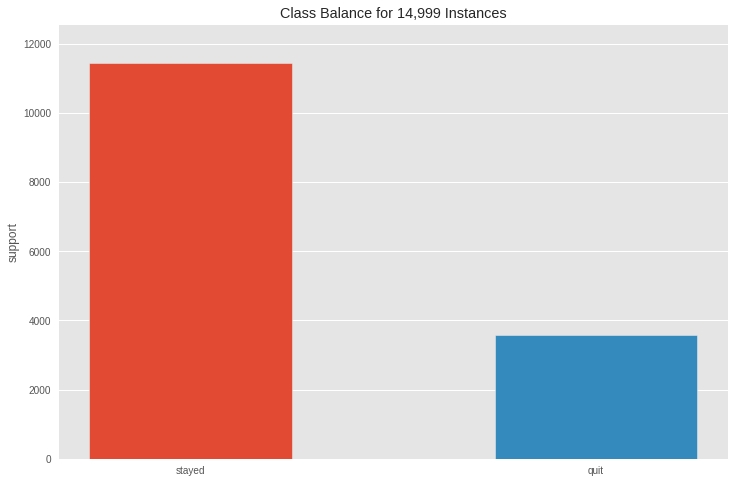

In [27]:
visualizer = ClassBalance(labels=['stayed', 'quit']).fit(hr.quit)
visualizer.show()

### Decision Tree Classifier
---

In [0]:
X = hr.loc[:, hr.columns !='quit']
y = hr.quit

In [0]:
from sklearn.model_selection import train_test_split

X_train, X_test, y_train, y_test = train_test_split(X, y, test_size = 0.2, stratify = y)

About:
 
 - Decision trees are non-parametric models which can model arbitrarily complex relations between inputs and outputs, without any a priori assumption
 
- Decision trees handle numeric and categorical variables

- They implement feature selection, making them robust to noisy features (to an extent)

- Robust to outliers or errors in labels

- Easily interpretable by even non-ML practioners.

#### Decision trees: partitioning the feature space:

![partition](assets/images/partition-feature-space.png)

- Decision trees generally have low bias but have high variance.
- We will solve the high variance problem in Task 8.

In [0]:
from sklearn import tree
from sklearn.tree import DecisionTreeClassifier
from sklearn.ensemble import RandomForestClassifier
from sklearn.metrics import accuracy_score
from sklearn.tree import export_graphviz # display the tree within a Jupyter notebook
from IPython.display import SVG
from graphviz import Source
from IPython.display import display
from ipywidgets import interactive, IntSlider, FloatSlider, interact
import ipywidgets
from IPython.display import Image
from subprocess import call
import matplotlib.image as mpimg

In [16]:
@interact
def plot_tree(crit=['gini', 'entropy'],
              split=['best', 'random'],
              depth=IntSlider(min=1,max=30,value=2, continuous_update=False),
              min_split=IntSlider(min=2,max=5,value=2, continuous_update=False),
              min_leaf=IntSlider(min=1,max=5,value=1, continuous_update=False)):
  estimator = DecisionTreeClassifier(criterion=crit, splitter=split, max_depth=depth,
                                     min_samples_split = min_split,
                                     min_samples_leaf = min_leaf).fit(X_train, y_train)

  print('Decision tree training accuracy: {:.3f}'.format(accuracy_score(y_train, estimator.predict(X_train))))
  print('Decision tree test accuracy: {:.3f}'.format(accuracy_score(y_test, estimator.predict(X_test))))

  graph = Source(tree.export_graphviz(estimator, out_file = None, feature_names=X_train.columns, 
                                      class_names = ['stayed', 'quit'],
                                      filled = True))
  
  display(Image(data = graph.pipe(format = 'png')))
  return estimator  

interactive(children=(Dropdown(description='crit', options=('gini', 'entropy'), value='gini'), Dropdown(descri…

### Random Forest Classifier
---

Although randomization increases bias, it is possible to get a reduction in variance of the ensemble. Random forests are one of the most robust machine learning algorithms for a variety of problems.

- Randomization and averaging lead to a reduction in variance and improve accuracy
- The implementations are parallelizable
- Memory consumption and training time can be reduced by bootstrapping
- Sampling features and not solely sampling examples is crucial to improving accuracy

In [17]:
@interact
def plot_tree_rf(crit=['gini', 'entropy'],
                 bootstrap=['True', 'False'],
                 depth=IntSlider(min=1,max=30,value=3, continuous_update=False),
                 forests=IntSlider(min=1,max=200,value=100,continuous_update=False),
                 min_split=IntSlider(min=2,max=5,value=2, continuous_update=False),
                 min_leaf=IntSlider(min=1,max=5,value=1, continuous_update=False)):
  
  estimator = RandomForestClassifier(criterion=crit, bootstrap=bootstrap, max_depth=depth,
                                     n_estimators = forests,
                                     min_samples_split = min_split,
                                     min_samples_leaf = min_leaf,
                                     n_jobs = -1,
                                     verbose = False)
  estimator.fit(X_train, y_train)

  print('Random Forest training accuracy: {:.3f}'.format(accuracy_score(y_train, estimator.predict(X_train))))
  print('Random Forest test accuracy: {:.3f}'.format(accuracy_score(y_test, estimator.predict(X_test))))
  num_tree = estimator.estimators_[0]
  graph = Source(tree.export_graphviz(num_tree, out_file = None, feature_names=X_train.columns, 
                                      class_names = ['stayed', 'quit'],
                                      filled = True))
  
  display(Image(data = graph.pipe(format = 'png')))
    
  return estimator  
    

interactive(children=(Dropdown(description='crit', options=('gini', 'entropy'), value='gini'), Dropdown(descri…

### Evaluation Metrics
---

In [0]:
from yellowbrick.model_selection import FeatureImportances
plt.rcParams['figure.figsize'] = (12,8)
plt.style.use("ggplot")

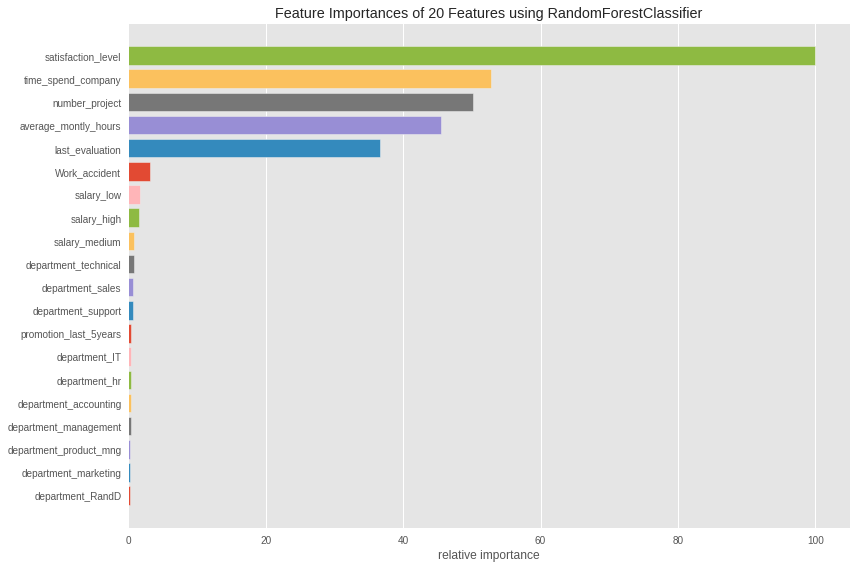

In [26]:
rf = RandomForestClassifier(bootstrap='True', ccp_alpha=0.0, class_weight=None,
                       criterion='gini', max_depth=15, max_features='auto',
                       max_leaf_nodes=None, max_samples=None,
                       min_impurity_decrease=0.0, min_impurity_split=None,
                       min_samples_leaf=2, min_samples_split=2,
                       min_weight_fraction_leaf=0.0, n_estimators=91, n_jobs=-1,
                       oob_score=False, random_state=None, verbose=False,
                       warm_start=False)

viz = FeatureImportances(rf)
viz.fit(X_train, y_train)
viz.show();

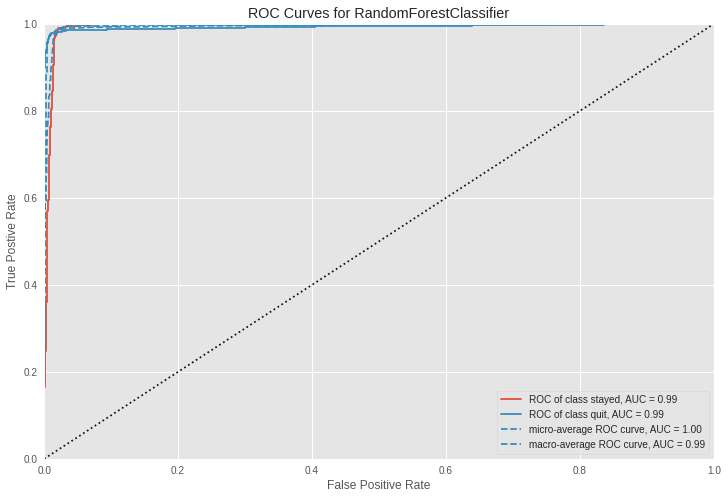

In [28]:
from yellowbrick.classifier import ROCAUC

visualizer = ROCAUC(rf, classes = ['stayed', 'quit'])

visualizer.fit(X_train, y_train)
visualizer.score(X_test, y_test)
visualizer.show();

 So results of 98.9% on train set is quite not bad. We reduced variance, avoided overfitting and used a couple of really cool visualization functions.